# Cut Labels with a Plane

This notebook shows how to cut from code a segmentation result generated from a volumetric image using a plane using `napari_crop.cut_with_plane`.

In [1]:
import numpy as np
import napari
from napari.utils import nbscreenshot
from skimage.data import cells3d
import pyclesperanto_prototype as cle
from napari_crop import cut_with_plane

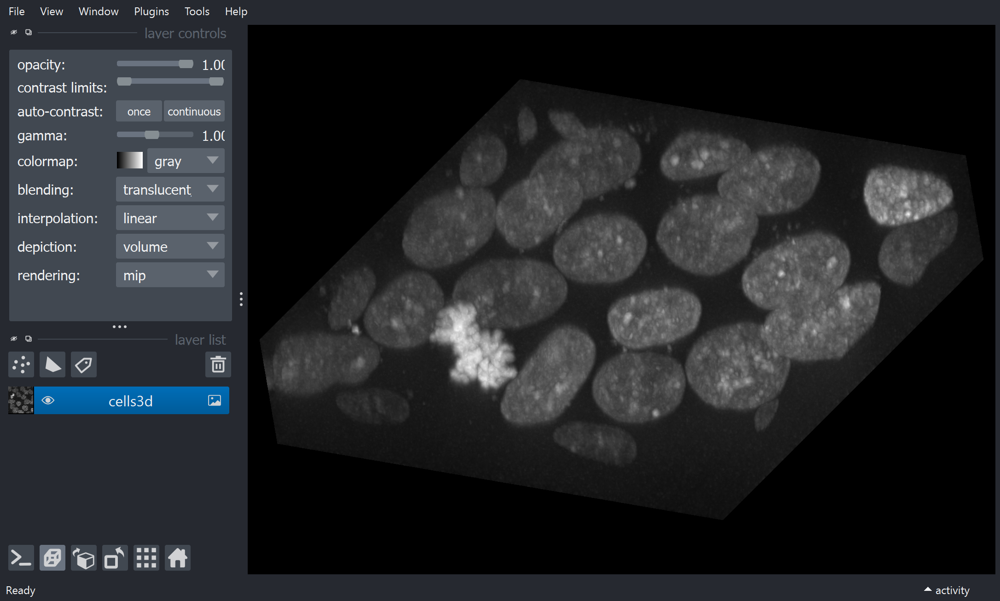

In [2]:


# from napari_crop import CutWithPlane

image = cells3d()[:, 1] # here we take just the nuclei channel
viewer = napari.Viewer(ndisplay=3)
viewer.add_image(image, name='cells3d')

# Change camera position for better 3D visualization
viewer.camera.angles = (45, 45, 45)

nbscreenshot(viewer)

# viewer.window.add_dock_widget(CutWithPlane(viewer), area='right')


## Add a plane to napari
The way to visualize a plane in napari is by adding a 3D image and setting the image layer `depiction` parameter to 'plane' and `blending` to 'additive'. You may also want to decrease the opacity of the original volume data in order to better visualize the plane.

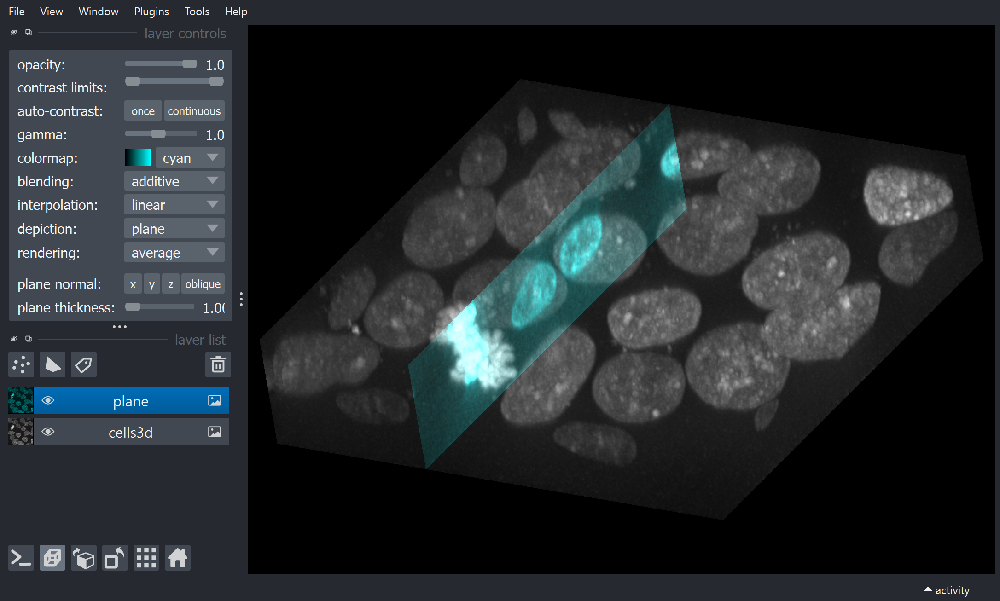

In [8]:
plane_parameters = {
    'position': (30, 85, 128),
    'normal': (0, 1, 0)
    }
plane_layer = viewer.add_image(
    image,
    name='plane',
    rendering='average',
    depiction='plane',
    blending='additive',
    colormap='cyan',
    plane=plane_parameters
    )

nbscreenshot(viewer)

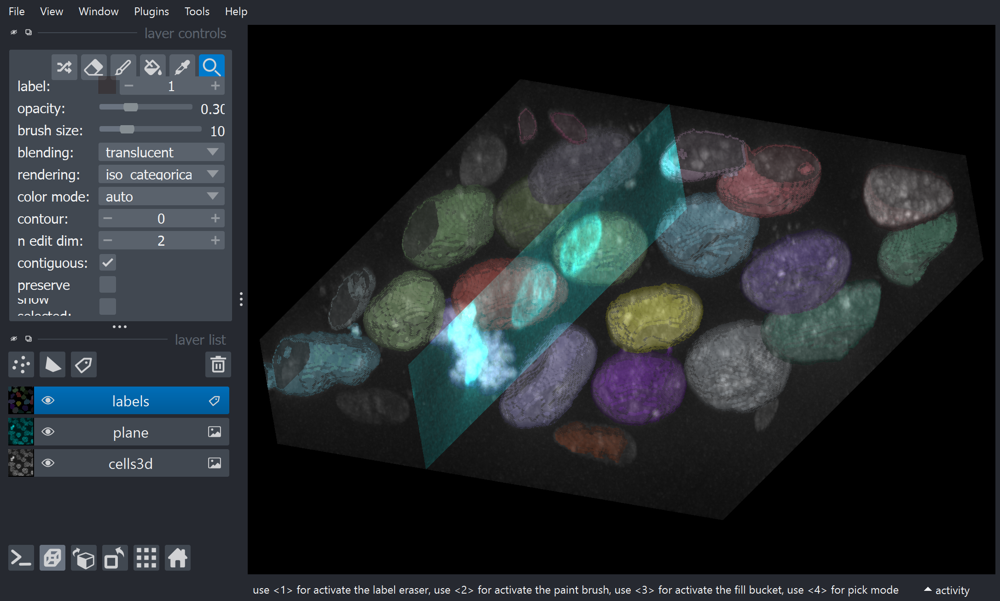

In [11]:
segmented = cle.voronoi_otsu_labeling(image, spot_sigma=10, outline_sigma=1)
viewer.add_labels(segmented, name='labels', opacity=0.3)

nbscreenshot(viewer)

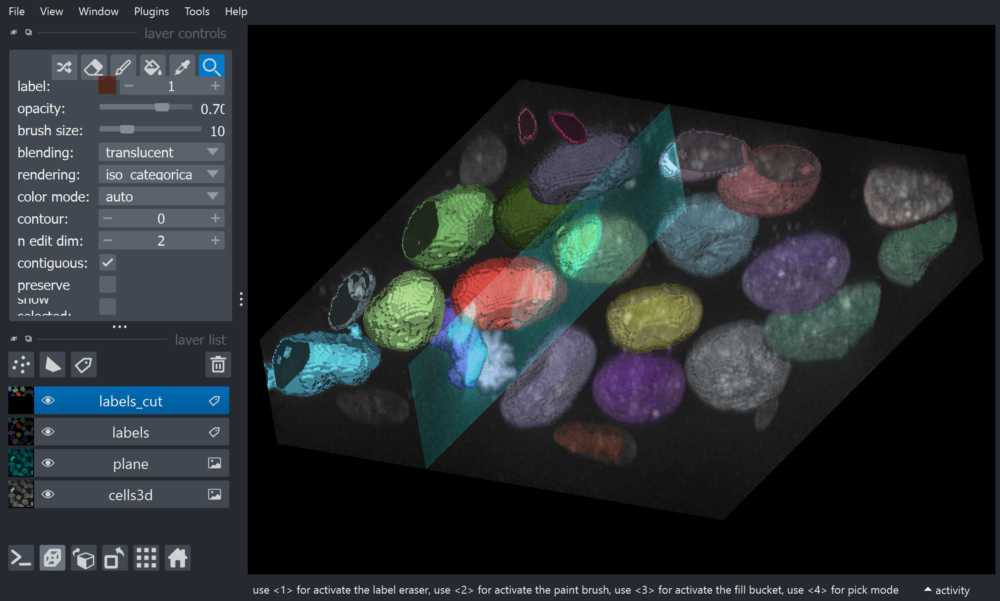

In [14]:
image_to_be_cut = segmented
plane_normal = plane_layer.plane.normal
plane_position = plane_layer.plane.position

labels_cut = cut_with_plane(image_to_be_cut, plane_normal, plane_position, positive_cut=False)

viewer.add_labels(labels_cut, name='labels_cut')

nbscreenshot(viewer)